In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("NYPD_Arrest_Data__Year_to_Date_.csv")

In [ ]:
#clean up
df = df.drop(["New Georeferenced Column","X_COORD_CD","Y_COORD_CD"],axis = 1)
print(df.size)
df.dropna(inplace=True)
print(df.size)
df.head()

4168048
4145232


,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
0,281369711,01/30/2024,177.0,SEXUAL ABUSE,116.0,SEX CRIMES,PL 1306501,F,M,25,0,25-44,M,BLACK,40.800930,-73.941098
1,284561406,03/30/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,B,44,0,25-44,M,BLACK,40.833209,-73.927554
2,284896016,04/06/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,M,19,0,25-44,M,BLACK,40.778348,-73.952863
3,285569016,04/18/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,K,69,0,25-44,M,BLACK,40.648698,-73.905128
4,287308954,05/22/2024,464.0,JOSTLING,230.0,JOSTLING,PL 1652501,M,M,18,0,18-24,M,WHITE,40.763313,-73.973717


In [ ]:
df.to_csv('updated_NYPD_Arrest_Data_YTD.csv')

In [ ]:
import pandas as pd
df = pd.read_csv("updated_NYPD_Arrest_Data_YTD.csv")

In [ ]:
#could clean up PD_DESC to remove multiple felonies/crimes - or find a way to simplify
#remove missing values
#remove weird values like 9 in category of crime

for i in df.columns[3:len(df.columns)-2]:
  print(i)
  # if i == "ARREST_DATE":
  #   break
  # for val in df[i].unique():
  #   print(val)
for i in df['OFNS_DESC'].unique():
  print(i)


PD_CD
PD_DESC
KY_CD
OFNS_DESC
LAW_CODE
LAW_CAT_CD
ARREST_BORO
ARREST_PRECINCT
JURISDICTION_CODE
AGE_GROUP
PERP_SEX
PERP_RACE
SEX CRIMES
FELONY ASSAULT
JOSTLING
RAPE
OTHER STATE LAWS
ARSON
ASSAULT 3 & RELATED OFFENSES
ESCAPE 3
VEHICLE AND TRAFFIC LAWS
DANGEROUS DRUGS
ROBBERY
GRAND LARCENY
FRAUDS
MISCELLANEOUS PENAL LAW
OTHER TRAFFIC INFRACTION
PETIT LARCENY
UNAUTHORIZED USE OF A VEHICLE
OFFENSES AGAINST PUBLIC ADMINI
CRIMINAL MISCHIEF & RELATED OF
DANGEROUS WEAPONS
CRIMINAL TRESPASS
OTHER OFFENSES RELATED TO THEFT
ALCOHOLIC BEVERAGE CONTROL LAW
BURGLARY
OTHER STATE LAWS (NON PENAL LAW)
MURDER & NON-NEGL. MANSLAUGHTE
OFFENSES INVOLVING FRAUD
INTOXICATED & IMPAIRED DRIVING
OFF. AGNST PUB ORD SENSBLTY &
PROSTITUTION & RELATED OFFENSES
CANNABIS RELATED OFFENSES
FORGERY
GAMBLING
POSSESSION OF STOLEN PROPERTY
OFFENSES AGAINST THE PERSON
GRAND LARCENY OF MOTOR VEHICLE
BURGLAR'S TOOLS
DISORDERLY CONDUCT
OFFENSES AGAINST PUBLIC SAFETY
HARRASSMENT 2
THEFT-FRAUD
INTOXICATED/IMPAIRED DRIVING
DISRUP

In [ ]:
print(df.columns)
df.head()

Index(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'Latitude',
       'Longitude'],
      dtype='object')


,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
0,281369711,01/30/2024,177.0,SEXUAL ABUSE,116.0,SEX CRIMES,PL 1306501,F,M,25,0,25-44,M,BLACK,40.800930,-73.941098
1,284561406,03/30/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,B,44,0,25-44,M,BLACK,40.833209,-73.927554
2,284896016,04/06/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,M,19,0,25-44,M,BLACK,40.778348,-73.952863
3,285569016,04/18/2024,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,K,69,0,25-44,M,BLACK,40.648698,-73.905128
4,287308954,05/22/2024,464.0,JOSTLING,230.0,JOSTLING,PL 1652501,M,M,18,0,18-24,M,WHITE,40.763313,-73.973717


<BarContainer object of 5 artists>

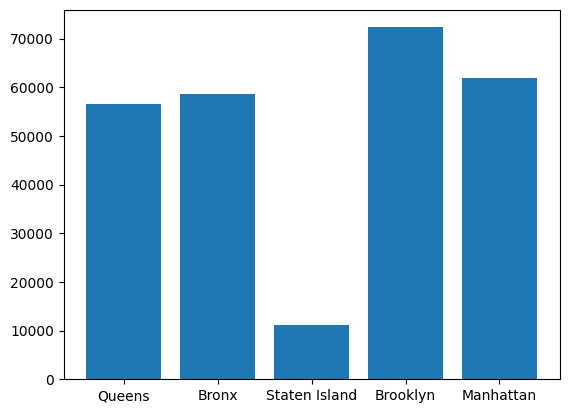

In [ ]:
#arrests per borough
borough_names = ['Queens','Bronx','Staten Island','Brooklyn','Manhattan']
borough_arrests = [len(df[df['ARREST_BORO'] == 'Q']),len(df[df['ARREST_BORO'] == 'B']),len(df[df['ARREST_BORO'] == 'S']),len(df[df['ARREST_BORO'] == 'K']),len(df[df['ARREST_BORO'] == 'M'])]
plt.bar(borough_names,borough_arrests)

Text(0, 0.5, 'Number of Arrests')

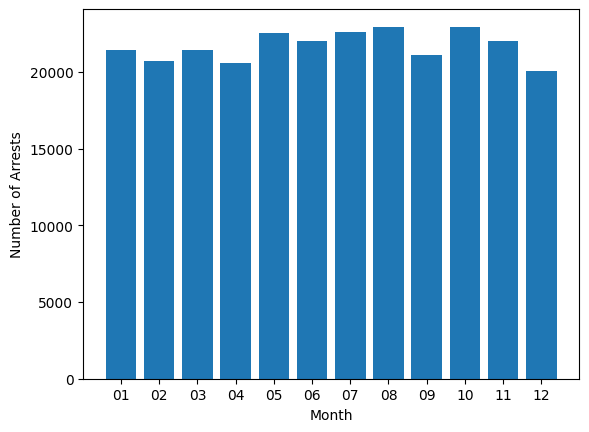

In [ ]:
#arrests throughout the month
month = ['01','02','03','04','05','06','07','08','09','10','11','12']
month_arrests = []
for i in month:
  month_arrests.append(len(df[df['ARREST_DATE'].str[:2] == i]))
plt.bar(month,month_arrests)
plt.xlabel('Month')
plt.ylabel('Number of Arrests')

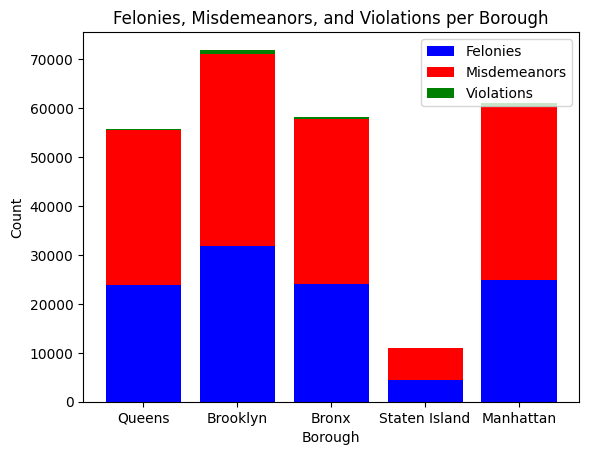

In [ ]:
#average felonies, misdemeanors, violations per borough
import numpy as np
queens = df[df['ARREST_BORO'] == 'Q']
brooklyn = df[df['ARREST_BORO'] == 'K']
bronx = df[df['ARREST_BORO'] == 'B']
statenisland = df[df['ARREST_BORO'] == 'S']
manhattan = df[df['ARREST_BORO'] == 'M']
boroughs = [queens,brooklyn,bronx,statenisland,manhattan]

counts = []
for borough in boroughs:
    felonies = len(borough[borough['LAW_CAT_CD'] == 'F'])
    misdemeanors = len(borough[borough['LAW_CAT_CD'] == 'M'])
    violations = len(borough[borough['LAW_CAT_CD'] == 'V'])
    counts.append([felonies, misdemeanors, violations])

counts = np.array(counts)

labels = ['Queens', 'Brooklyn', 'Bronx', 'Staten Island', 'Manhattan']
x = np.arange(len(labels))

plt.bar(x, counts[:, 0], label='Felonies', color='b')
plt.bar(x, counts[:, 1], bottom=counts[:, 0], label='Misdemeanors', color='r')
plt.bar(x, counts[:, 2], bottom=counts[:, 0] + counts[:, 1], label='Violations', color='g')

plt.xlabel('Borough')
plt.ylabel('Count')
plt.title('Felonies, Misdemeanors, and Violations per Borough')
plt.xticks(x, labels)
plt.legend()

plt.show()

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(df,
                        lat="Latitude",
                        lon="Longitude",
                        hover_name="ARREST_KEY",
                        hover_data=["ARREST_KEY"],
                        color = "LAW_CAT_CD",
                        labels={"LAW_CAT_CD": "Category of Crime"},
                        zoom=10,
                        height=1000,
                        width=1000)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#used https://stackoverflow.com/questions/53233228/plot-latitude-longitude-from-csv-in-python-3-6 for help, specifically leenremm's answer + plotly's pages.

In [ ]:
#precincts with most amount of arrests per borough
queens = df[df['ARREST_BORO'] == 'Q']
brooklyn = df[df['ARREST_BORO'] == 'K']
bronx = df[df['ARREST_BORO'] == 'B']
statenisland = df[df['ARREST_BORO'] == 'S']
manhattan = df[df['ARREST_BORO'] == 'M']
boroughs = [queens,brooklyn,bronx,statenisland,manhattan]
for borough in boroughs:
  #count num per precinct - make new df so you can grab more data from each precinct's arrests?
  #unique precincts - dictionary?